In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from analysis_utils import get_morphology_results_from_folder


Read data from folder

In [23]:
df, X_scaled = get_morphology_results_from_folder(
    folder_path=r"C:\Users\chris\Desktop\University\Thesis\PipelineResults\Many_Patients",
    remove_outlier_sizes=False,
    remove_edges=False,
)
scan_data_root = Path(r"C:\Users\chris\Desktop\University\Thesis\ScanData\All_scans_tiled")

Number of cells in analysis 1679362


In [12]:
print(df.columns)

Index(['cell_id', 'skeleton_length', 'num_junctions', 'num_components',
       'num_end_nodes', 'num_start_nodes', 'total_nodes', 'end_to_start_ratio',
       'soma_area', 'soma_perimeter', 'soma_circularity', 'cell_area',
       'cell_perimeter', 'cell_convex_hull_area', 'cell_convex_hull_perimeter',
       'cell_solidity', 'cell_convexity', 'cell_circularity',
       'cell_convex_circularity', 'branch_area', 'branch_perimeter',
       'sholl_min_radius', 'sholl_peak_radius', 'sholl_max_radius',
       'sholl_peak', 'sholl_sum', 'xmin', 'ymin', 'xmax', 'ymax', 'image_name',
       'scan_name', 'global_cell_id'],
      dtype='object')


In [24]:
def remove_duplicate_cells_by_box_corners(df, corner_tolerance_px=2, min_shared_corners=2):
    """
    Remove near-duplicate detections per image by corner agreement.

    Two boxes are considered duplicates if they share at least `min_shared_corners`
    corners within `corner_tolerance_px` in both x and y. For each duplicate group,
    keep only the cell with the largest box area.
    """
    required_cols = ["scan_name", "image_name", "xmin", "ymin", "xmax", "ymax"]
    missing = [c for c in required_cols if c not in df.columns]
    if missing:
        raise ValueError(f"Missing required columns: {missing}")

    def get_corners(box):
        x1, y1, x2, y2 = box
        return np.array([[x1, y1], [x1, y2], [x2, y1], [x2, y2]], dtype=float)

    def shared_corner_count(box_a, box_b, tol):
        corners_a = get_corners(box_a)
        corners_b = get_corners(box_b)

        matched_b = set()
        shared = 0

        for ca in corners_a:
            for j, cb in enumerate(corners_b):
                if j in matched_b:
                    continue
                if abs(ca[0] - cb[0]) <= tol and abs(ca[1] - cb[1]) <= tol:
                    matched_b.add(j)
                    shared += 1
                    break

        return shared

    keep_indices = []

    for (_, _), group in df.groupby(["scan_name", "image_name"], sort=False):
        if len(group) <= 1:
            keep_indices.extend(group.index.tolist())
            continue

        boxes = group[["xmin", "ymin", "xmax", "ymax"]].to_numpy(dtype=float)
        group_index = group.index.to_numpy()
        n = len(group)

        parent = np.arange(n, dtype=np.int32)

        def find(x):
            while parent[x] != x:
                parent[x] = parent[parent[x]]
                x = parent[x]
            return x

        def union(a, b):
            ra = find(a)
            rb = find(b)
            if ra != rb:
                parent[rb] = ra

        for i in range(n - 1):
            for j in range(i + 1, n):
                shared = shared_corner_count(boxes[i], boxes[j], corner_tolerance_px)
                if shared >= min_shared_corners:
                    union(i, j)

        components = {}
        for i in range(n):
            root = find(i)
            components.setdefault(root, []).append(i)

        for members in components.values():
            if len(members) == 1:
                keep_indices.append(group_index[members[0]])
                continue

            member_boxes = boxes[members]
            areas = (member_boxes[:, 2] - member_boxes[:, 0]) * (member_boxes[:, 3] - member_boxes[:, 1])
            best_local_idx = members[int(np.argmax(areas))]
            keep_indices.append(group_index[best_local_idx])

    deduped_df = df.loc[keep_indices].copy()
    deduped_df = deduped_df.sort_index()

    removed = len(df) - len(deduped_df)
    print(f"Removed {removed} duplicate cells ({len(df)} -> {len(deduped_df)})")
    return deduped_df


df = remove_duplicate_cells_by_box_corners(
    df,
    corner_tolerance_px=8,
    min_shared_corners=1,
)

Removed 64360 duplicate cells (1679362 -> 1615002)


Find dense spatial clusters of cells (5+ cells whose boxes overlap or are very close).

Found 30 clusters (min size=5, threshold=1px).
Cluster sizes: [5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5]


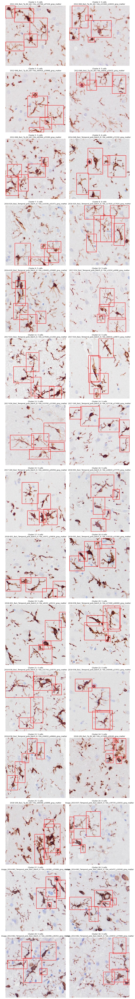

In [26]:
def _connected_components_for_boxes(boxes, distance_threshold_px=6):
    """Return connected components of nearby/overlapping boxes."""
    n = len(boxes)
    if n == 0:
        return []

    parent = np.arange(n, dtype=np.int32)

    def find(x):
        while parent[x] != x:
            parent[x] = parent[parent[x]]
            x = parent[x]
        return x

    def union(a, b):
        ra = find(a)
        rb = find(b)
        if ra != rb:
            parent[rb] = ra

    idx_sorted = np.argsort(boxes[:, 0])

    for pos_i, i in enumerate(idx_sorted):
        xi_min, yi_min, xi_max, yi_max = boxes[i]

        for pos_j in range(pos_i + 1, n):
            j = idx_sorted[pos_j]
            xj_min, yj_min, xj_max, yj_max = boxes[j]

            if xj_min > xi_max + distance_threshold_px:
                break

            if yj_min > yi_max + distance_threshold_px or yj_max < yi_min - distance_threshold_px:
                continue

            gap_x = max(0.0, max(xi_min - xj_max, xj_min - xi_max))
            gap_y = max(0.0, max(yi_min - yj_max, yj_min - yi_max))

            if gap_x <= distance_threshold_px and gap_y <= distance_threshold_px:
                union(i, j)

    groups = {}
    for i in range(n):
        root = find(i)
        groups.setdefault(root, []).append(i)

    return list(groups.values())


def find_spatial_cell_clusters(df, min_cells_in_cluster=5, distance_threshold_px=6, n_clusters=12):
    """Find first n image-local clusters with many nearby bounding boxes."""
    required_cols = ["scan_name", "image_name", "xmin", "ymin", "xmax", "ymax"]
    missing = [c for c in required_cols if c not in df.columns]
    if missing:
        raise ValueError(f"Missing required columns: {missing}")

    found = []

    grouped = df.groupby(["scan_name", "image_name"], sort=True)
    for (scan_name, image_name), group in grouped:
        if len(group) < min_cells_in_cluster:
            continue

        boxes = group[["xmin", "ymin", "xmax", "ymax"]].to_numpy(dtype=float)
        components = _connected_components_for_boxes(
            boxes,
            distance_threshold_px=distance_threshold_px,
        )

        for comp in sorted(components, key=len, reverse=True):
            if len(comp) < min_cells_in_cluster:
                continue

            cluster_rows = group.iloc[comp].copy()
            found.append(
                {
                    "scan_name": scan_name,
                    "image_name": image_name,
                    "n_cells": len(cluster_rows),
                    "cells": cluster_rows,
                }
            )

            if len(found) >= n_clusters:
                return found

    return found


def show_spatial_clusters(clusters, scan_data_root, n_to_show=8, figsize_scale=5):
    if not clusters:
        print("No clusters found with current settings.")
        return

    k = min(n_to_show, len(clusters))
    ncols = 2
    nrows = int(np.ceil(k / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(figsize_scale * ncols, figsize_scale * nrows))
    axes = np.array(axes).reshape(-1)

    for i in range(k):
        ax = axes[i]
        cluster = clusters[i]

        image_path = Path(scan_data_root) / cluster["scan_name"] / f"{cluster['image_name']}.jpg"
        image = cv2.imread(str(image_path))

        if image is None:
            ax.set_title(f"Missing image\n{cluster['scan_name']} / {cluster['image_name']}")
            ax.axis("off")
            continue

        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        for _, row in cluster["cells"].iterrows():
            x1, y1, x2, y2 = map(int, [row["xmin"], row["ymin"], row["xmax"], row["ymax"]])
            cv2.rectangle(image_rgb, (x1, y1), (x2, y2), (255, 40, 40), 2)

        ax.imshow(image_rgb)
        ax.axis("off")
        ax.set_title(
            f"Cluster {i + 1}: {cluster['n_cells']} cells\n{cluster['scan_name']} / {cluster['image_name']}",
            fontsize=9,
        )

    for j in range(k, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()


n_clusters_to_return = 30
min_cells_in_cluster = 5
distance_threshold_px = 1

spatial_clusters = find_spatial_cell_clusters(
    df,
    min_cells_in_cluster=min_cells_in_cluster,
    distance_threshold_px=distance_threshold_px,
    n_clusters=n_clusters_to_return,
)

print(f"Found {len(spatial_clusters)} clusters (min size={min_cells_in_cluster}, threshold={distance_threshold_px}px).")
if spatial_clusters:
    print("Cluster sizes:", [c["n_cells"] for c in spatial_clusters])

show_spatial_clusters(spatial_clusters, scan_data_root, n_to_show=n_clusters_to_return)